# Sect 20 (v2.1): Extensions to Linear Models

- online-ds-pt-100719
- 03/03/20

## Objectives

**DISCUSSION:**
- Discuss interactions between variables
- Discuss using dictionaries for scrubbing the whole df in a few lines of code. 
- Discuss polynomial regressions.
- Discuss the Bias vs Variance trade-off.



**APPLICATION:**
- Linear Regression with Boston Housing data set

## Topics Covered in Section 20


- Interactions
- Polynomial Regression    
- Bias-Variance Trade Off

## Questions / Comments
- Shape issues with skearn
- Using `model.predict(X)`

In [1]:
!pip install -U fsds
from fsds.imports import *

pd.set_option('display.max_columns',0)
plt.style.use('seaborn-notebook')

fsds v0.2.23 loaded.  Read the docs: https://fs-ds.readthedocs.io/en/latest/ 


Handle,Package,Description
dp,IPython.display,Display modules with helpful display and clearing commands.
fs,fsds,Custom data science bootcamp student package
mpl,matplotlib,Matplotlib's base OOP module with formatting artists
plt,matplotlib.pyplot,Matplotlib's matlab-like plotting module
np,numpy,scientific computing with Python
pd,pandas,High performance data structures and tools
sns,seaborn,High-level data visualization library based on matplotlib


[i] Pandas .iplot() method activated.


In [2]:
# def load_dataset():
#     df = fs.datasets.load_boston()

#     # Making example column
#     data = ['?',1,2,3,4,np.nan,"N/A"]
#     df['example'] = np.random.choice(data,len(df),replace=True)
#     return df

df = fs.datasets.load_boston()
df.head()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,LSTAT,price
0,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1.0,296.0,15.3,4.98,24.0
1,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2.0,242.0,17.8,9.14,21.6
2,0.02729,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2.0,242.0,17.8,4.03,34.7
3,0.03237,0.0,2.18,0.0,0.458,6.998,45.8,6.0622,3.0,222.0,18.7,2.94,33.4
4,0.06905,0.0,2.18,0.0,0.458,7.147,54.2,6.0622,3.0,222.0,18.7,5.33,36.2


# Interactions

## What is an interaction?

When variables interact to **cause an effect** to another variable but is **not the sum of their parts**

> "An interaction is a particular property of two or more variables where they interact in a non-additive manner when affecting a third variable" - *Section recap*

<img src="https://raw.githubusercontent.com/jirvingphd/dsc-interaction-terms-online-ds-pt-100719/master/images/new_diet_image.png">


> In our example, the interaction plot was composed out of categorical predictors (countries and diet type), but interactions can occur between categorical variables or between a mix of categorical variables and continuous variables!

### Confounding factor

>This means that the "Country" and "Diet" affect weight loss in a non-additive matter. If we're mostly interested in the effect of diet on weight loss (which seems to be plausible here), we say that "Country" is a **confounding factor** of the effect of "Diet" on weight loss.

![](images/diet_interaction.png)

### Why is important to account for interactions?

> - "Not accounting for them might lead to results that are wrong."

> - You'll also notice that including them when they're needed will increase your $R^2$ value!


- Replacing 2 individual columns with their interaction column can reduce the overall number of features.

- One way of addessing multicollinearity is to replace 2 multicollinear columns with the interaction term.

### When should we use interactions?

- Whenever it can help the model, but not required.
- Can use in hypothesis testing as well (for ANOVAs)

## Using seaborn to view interactions

https://blog.insightdatascience.com/data-visualization-in-python-advanced-functionality-in-seaborn-20d217f1a9a6

- ~~`sns.factorplot`~~
- `sns.catplot`
- `sns.FacetGrid`

### Ex Interaction: Not very different

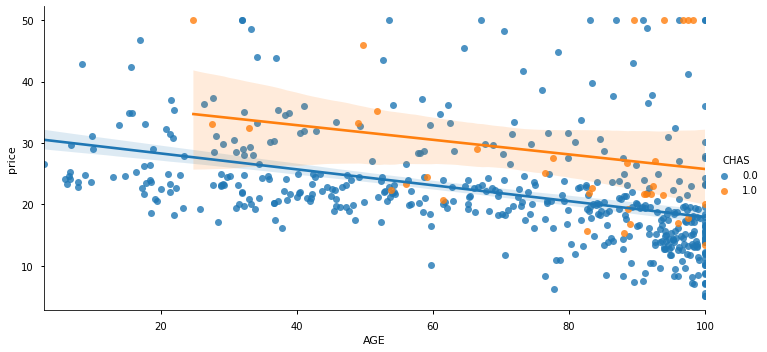

In [3]:
g = sns.FacetGrid(df,hue='CHAS',aspect=2,height=5)
g.map(sns.regplot,'AGE','price')
g.add_legend()

### Ex Interaction: different

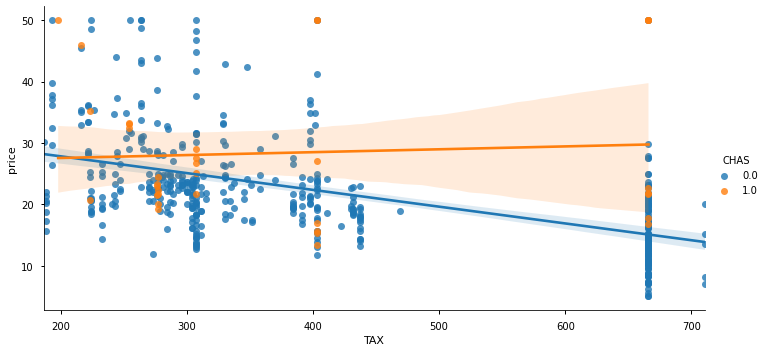

In [4]:
g = sns.FacetGrid(df,hue='CHAS',aspect=2,height=5)
g.map(sns.regplot,'TAX','price')
g.add_legend()

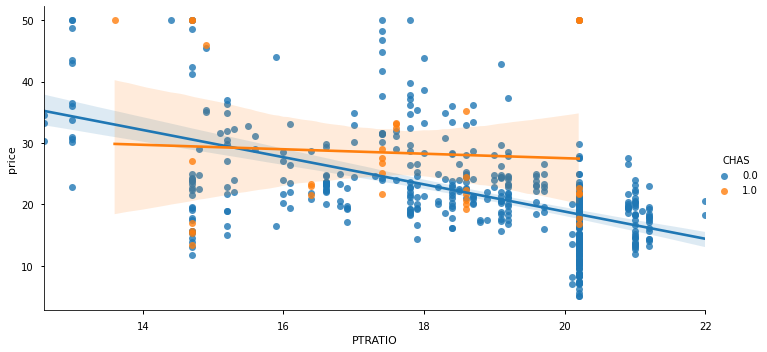

In [5]:
g = sns.FacetGrid(df,hue='CHAS',aspect=2,height=5)
g.map(sns.regplot,'PTRATIO','price')
g.add_legend()

# High-Level Programmatic Scrubbing with `pandas_profiling` and dictionaries

#### OSEMN
1. **[OBTAIN](#OBTAIN)**
    - Import data, inspect, check dtypes, preview
    - Drop unneeded columns

2. **[SCRUB](#SCRUB)**
    - Recast data types
    - Find and deal with weird/placeholder values
    - Check for and Address null values
    - Identify (& remove) outliers
    - Check for multicollinearity
    - Normalize/standardize data (depending on type of model)
    

         
3. **[EXPLORE](#EXPLORE)**
    - [ ] Check distributions, outliers, etc
    - [ ] Check scales, ranges (df.describe())
    - [ ] Check histograms to get an idea of distributions (df.hist()) and data transformations to perform.
    - [ ] Use scatter plots to check for linearity and possible categorical variables 
    - [ ] Check for linear relationships (if required by model).
   
4. **[MODEL](#MODEL)**

    - **Fit an initial model:** 
        - Run an initial model and get results

    - **Holdout validation / Train/test split**
        - use sklearn `train_test_split`
    
5. **[iNTERPRET](#iNTERPRET)**
    - **Assessing the model:**
        - Assess parameters (slope,intercept)
        - Check if the model explains the variation in the data (RMSE, F, R_square)
        - *Are the coeffs, slopes, intercepts in appropriate units?*
        - *Whats the impact of collinearity? Can we ignore?*
        <br><br>
    - **Revise the fitted model**
        - Multicollinearity is big issue for lin regression and cannot fully remove it
        - Use the predictive ability of model to test it (like R2 and RMSE)
        - Check for missed non-linearity
        
- **Interpret final model and draw >=3 conclusions and recommendations from dataset**

### Quick EDA/Srubbing with `pandas_profiling` and dictionaries.

- When we know what we must address, we can use advanced tool and loops/dictionaries to do all scrubbing in a few lines of code3

- [Speed Up Your Exploratory Data Analysis With Pandas-Profiling](https://towardsdatascience.com/speed-up-your-exploratory-data-analysis-with-pandas-profiling-88b33dc53625)

```python
from pandas_profiling import ProfileReport
ProfileReport(df)```

In [6]:
# df = load_dataset()
df.head()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,LSTAT,price
0,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1.0,296.0,15.3,4.98,24.0
1,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2.0,242.0,17.8,9.14,21.6
2,0.02729,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2.0,242.0,17.8,4.03,34.7
3,0.03237,0.0,2.18,0.0,0.458,6.998,45.8,6.0622,3.0,222.0,18.7,2.94,33.4
4,0.06905,0.0,2.18,0.0,0.458,7.147,54.2,6.0622,3.0,222.0,18.7,5.33,36.2


In [7]:
from pandas_profiling import ProfileReport
ProfileReport(df)

2. **[SCRUB](#SCRUB)**
    - Recast data types
    - Find and deal with weird/placeholder values
    - Check for and Address null values
    - Identify (& remove) outliers
    - Check for multicollinearity
    - Normalize/standardize data (depending on type of model)
    

In [8]:
## Drop unneeded cols
drop_cols = ['INDUS']
[df.drop(col,axis=1,inplace=True) for col in drop_cols if col in df.columns]
df.head()

,CRIM,ZN,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,LSTAT,price
0,0.00632,18.0,0.0,0.538,6.575,65.2,4.0900,1.0,296.0,15.3,4.98,24.0
1,0.02731,0.0,0.0,0.469,6.421,78.9,4.9671,2.0,242.0,17.8,9.14,21.6
2,0.02729,0.0,0.0,0.469,7.185,61.1,4.9671,2.0,242.0,17.8,4.03,34.7
3,0.03237,0.0,0.0,0.458,6.998,45.8,6.0622,3.0,222.0,18.7,2.94,33.4
4,0.06905,0.0,0.0,0.458,7.147,54.2,6.0622,3.0,222.0,18.7,5.33,36.2


In [9]:
# ## Find and deal with weird/placeholder values
# display(df['example'].value_counts(dropna=False))
# df['example'].isna().sum()

In [10]:
# help(df['example'].replace)

In [11]:
# ## Replacing Values
# repl_dict = {'example': {'?':0,
#                         'N/A':np.nan,
#                         'nan':np.nan}}

# for col, replace_vals in repl_dict.items():
#     df[col] = df[col].replace(replace_vals)


In [12]:
# ## Find and deal with weird/placeholder values
# display(df['example'].value_counts(dropna=False))
# df['example'].isna().sum()

In [13]:
# ## Fill Null values / zeros
fillna_dict = {}
for col, val in fillna_dict.items():
    df[col] = df[col].fillna(val)

In [14]:
## Recasting datatypes
df.dtypes

CRIM       float64
ZN         float64
CHAS       float64
NOX        float64
RM         float64
AGE        float64
DIS        float64
RAD        float64
TAX        float64
PTRATIO    float64
LSTAT      float64
price      float64
dtype: object

In [15]:
recast_dict = {'CHAS':int}
for col, dtype in recast_dict.items():
    df[col] = df[col].astype(dtype)

In [16]:
df.dtypes

CRIM       float64
ZN         float64
CHAS         int64
NOX        float64
RM         float64
AGE        float64
DIS        float64
RAD        float64
TAX        float64
PTRATIO    float64
LSTAT      float64
price      float64
dtype: object

In [17]:
## we can wrap everything we did above in 1 function
def scrub_df(data,drop_cols =[],#['id','date','view'],
                       repl_dict = {},#{'sqft_basement':('?','0.0')},
                       recast_dict = {},#{'sqft_basement':'float'},
                       fillna_dict = {},#{'waterfront':0,'yr_renovated':0},
                      verbose=1):
    """
    Performs scrubbing process on the df in the following order:
    1. Drop cols in the drop_cols list
    2. Replace values using repl_dict
    3. Recast dtypes using recast_dict
    4. Fillna using fillna_dict
    
    Args:
        data (Frame):
        drop_cols (list):
        repl_dict (dict): Key=column name, 
                            value= dict of {to_replace:replace_with}
        recast_dict(dict): 
        fillna_dict(dict): key = column name,
                            val = value to fill with or function to apply 
    """
    import copy
    df = copy.deepcopy(data)#.copy()
    
    ## Drop cols
    drop_cols = []
    [df.drop(col,axis=1,inplace=True) for col in drop_cols if col in df.columns]


    ## Replacing Values
    for col,replace_vals in repl_dict.items():
            df[col] = df[col].replace(replace_vals)


    
    ## Fill Null values / zeros
    for col,val in fillna_dict.items():
        import types
        if isinstance(val, types.FunctionType):
            fill_val = val(df[col])
        else:
            fill_val = val
        
        df[col].fillna(fill_val,inplace=True)
 
    ## Recasting datatypes
    for col,dtype in recast_dict.items():
        df[col] = df[col].astype(dtype)
    df.dtypes
    
    ## display preview
    if verbose>0:
        display(df.head())
    if verbose>1:
        display(df.info())

    return df
    

In [18]:
df = fs.datasets.load_boston()
## use function
df = scrub_df(df, drop_cols=drop_cols,repl_dict=repl_dict, 
              recast_dict=recast_dict,fillna_dict=fillna_dict)
df.info()

NameError: name 'repl_dict' is not defined

In [ ]:
df['example'].value_counts()

In [ ]:
df.describe().round(3)

In [ ]:
df.select_dtypes('int').columns

In [ ]:
help(df.select_dtypes)

In [ ]:
df['CHAS'].value_counts()

In [ ]:
## Get lists of categorical vs numeric columns
target = 'price'

## Scale non-categorical columns
cat_cols = list(df.select_dtypes('int').columns)
num_cols = list(df.drop(columns=[target]).select_dtypes(include = ['number'],
                                                   exclude= ['int']).columns)
cat_cols, num_cols



In [ ]:
## Scale data
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
df[num_cols] = scaler.fit_transform(df[num_cols])

In [ ]:
df.describe().round(3)

In [ ]:
# deal with outliers in numeric non-target columns
idx_out = fs.find_outliers_Z(df['CRIM'])
df.loc[idx_out]

In [ ]:
df_outs = pd.DataFrame()
## Find outliers
for col in num_cols:
    idx_outs = fs.find_outliers_Z(df[col])
    df_outs[col]= idx_outs
df_outs

In [ ]:
## Remove outliers
out_rows = df_outs.any(axis=1)
out_rows

In [ ]:
df = df.loc[~out_rows]
df

In [ ]:
df.describe().round(3)

In [ ]:
target='price'
col_list = list(df.drop(target,axis=1).columns)
col_list

In [ ]:
## remove exclude cols
exclude_cols=[]#'example']
[col_list.remove(ecol) for ecol in exclude_cols if ecol in col_list]
col_list

In [ ]:
## Make rightn side of formula eqn
features = ' + '.join(col_list)
features

In [ ]:
features+'C(example)'

In [ ]:
cat_cols

In [ ]:
# ADD C() around categorical cols
for col in cat_cols:
    features = features.replace(col,f"C({col})")

features    

In [ ]:
## MAKE FULL FORMULA
formula = target+'~'+features #target~predictors
print(formula)

In [ ]:
import scipy.stats as stats
import statsmodels.api as sms
import statsmodels.formula.api as smf

## Fit model
model = smf.ols(formula=formula, data=df).fit()
model.summary()

In [ ]:
 
def diagnose_model(model):
    """
    Plot Q-Q plot and model residuals from statsmodels ols model.
    
    Args:
        model (smf.ols model): statsmodels formula ols 
    
    Returns:
        fig, ax: matplotlib objects
    """
    
    resids = model.resid
    
    fig,ax = plt.subplots(ncols=2,figsize=(10,5))
    sms.qqplot(resids, stats.distributions.norm,
              fit=True, line='45',ax=ax[0])
    xs = np.linspace(0,1,len(resids))
    ax[1].scatter(x=xs,y=resids)
    
    return fig,ax 

diagnose_model(model)

In [ ]:
import scipy.stats as stats
import statsmodels.api as sms
import statsmodels.formula.api as smf


def make_ols_f(df,target='price',col_list=None,exclude_cols=[],
               cat_cols = [],  show_summary=True,
               diagnose=True,
               return_formula=False):
    """
    Makes statsmodels formula-based regression with options to make categorical columns.    
    Args:
        df (Frame): df with data
        target (str): target column name
        col_list (list, optional): List of predictor columns. Defaults to all except target.
        exclude_cols (list, optional): Columns to remove from col_list. Defaults to [].
        cat_cols (list, optional): Columns to process as categorical using f'C({col})". Defaults to [].
        show_summary (bool, optional): Display model.summary(). Defaults to True.
        diagnose (bool, optional): Plot Q-Q plot & residuals. Defaults to True.
        return_formula (bool, optional): Return formula with model. Defaults to False.
    
    Returns:
        model : statsmodels ols model
        formula : str formula from model, only if return_formula == True
        
    
    """
    if col_list is None:
        col_list = list(df.drop(target,axis=1).columns)
        
    ## remove exclude cols
    [col_list.remove(ecol) for ecol in exclude_cols if ecol in col_list]

    ## Make rightn side of formula eqn
    features = '+'.join(col_list)

    # ADD C() around categorical cols
    for col in cat_cols:
        features = features.replace(col,f"C({col})")

    ## MAKE FULL FORMULA
    formula = target+'~'+features #target~predictors
    #print(formula)
    
    ## Fit model
    model = smf.ols(formula=formula, data=df).fit()
    
    ## Display summary
    if show_summary:
        display(model.summary())
        
    ## Plot Q-Qplot & model residuals
    if diagnose:
        fig,ax = diagnose_model(model)
        plt.show()

    # Returns formula or just mmodel
    if return_formula:
        return model,formula
    else:
        return model

   

## Making a baseline model

In [ ]:
kws = dict( target='price')#,cat_cols=cat_cols )
model = make_ols_f(df,**kws)#,target='price',cat_cols=cat_cols)

In [ ]:
## Get p-values
res = pd.DataFrame({'p-value': model.pvalues,
             'coeffs' :model.params,
             'sig': model.pvalues <.05})
res

In [ ]:
## get list of cols to exclude
res.loc[res['sig']==True]

In [ ]:
res.query('sig == False')

## Interactions Effect On Model

### Adding interaction terms

In [ ]:
df['CHAS_TAX'] = df['CHAS'] * df['TAX']
df.head()

In [ ]:
## Fit model
target='price'
features = df.drop(columns=[target]).columns

formula = target+ ' ~ '+ '+'.join(features)

model = smf.ols(formula=formula, data=df).fit()
display(model.summary())
diagnose_model(model)

# make_ols_f(df,cat_cols=cat_cols)

In [ ]:
## To create multiple interaction columns
ixn_cols = [['CHAS',"TAX"],
            ['CHAS','PTRATIO']]

for cols in ixn_cols:
    df[cols[0]+'_'+ cols[1]] = df[cols[0]] * df[cols[1]]
df.head()

In [ ]:
## Fit model
target='price'
features = df.drop(columns=[target]).columns

formula = target+ ' ~ '+ '+'.join(features)

model = smf.ols(formula=formula, data=df).fit()
display(model.summary())
diagnose_model(model)

In [ ]:
def make_ols_f_ixn(df,target='price',col_list=None,exclude_cols=[],
               cat_cols = [], ixn_cols=[],  show_summary=True,
               diagnose=True,
               return_formula=False):
    """
    Makes statsmodels formula-based regression with options to make categorical columns.    
    Args:
        df (Frame): df with data
        target (str): target column name
        col_list (list, optional): List of predictor columns. Defaults to all except target.
        exclude_cols (list, optional): Columns to remove from col_list. Defaults to [].
        cat_cols (list, optional): Columns to process as categorical using f'C({col})". Defaults to [].
        ixn_cols ()
        show_summary (bool, optional): Display model.summary(). Defaults to True.
        diagnose (bool, optional): Plot Q-Q plot & residuals. Defaults to True.
        return_formula (bool, optional): Return formula with model. Defaults to False.
    
    Returns:
        model : statsmodels ols model
        formula : str formula from model, only if return_formula == True
        
    
    """
    if col_list is None:
        col_list = list(df.drop(target,axis=1).columns)
        
    ## remove exclude cols
    [col_list.remove(ecol) for ecol in exclude_cols if ecol in col_list]
    
    ## ADDDING INTERACTION TERMS    
    if len(ixn_cols)>0:
        for ixn in ixn_cols:
            ixn_term=f"{ixn[0]}*{ixn[1]}"
            col_list.append(ixn_term) #= features + ixn_term
        
        
    ## Make rightn side of formula eqn
    features = '+'.join(col_list)

    # ADD C() around categorical cols
    for col in cat_cols:
        features = features.replace(col,f"C({col})")


        
    ## MAKE FULL FORMULA
    formula = target+'~'+features #target~predictors
    #print(formula)
    
    ## Fit model
    model = smf.ols(formula=formula, data=df).fit()
    
    ## Display summary
    if show_summary:
        display(model.summary())
        
    ## Plot Q-Qplot & model residuals
    if diagnose:
        fig,ax = diagnose_model(model)
        plt.show()

    # Returns formula or just mmodel
    if return_formula:
        return model,formula
    else:
        return model
    
    

In [ ]:
make_ols_f_ixn(df,ixn_cols=ixn_cols,**kws)

## Testing all possible interactions

In [ ]:
import itertools

ixn_cols = list(df.drop(columns=[target]).columns)
ixn_cols

In [ ]:
ixn_cols = list(itertools.combinations(ixn_cols,2))

In [ ]:
kws

In [ ]:
model = make_ols_f_ixn(df,**kws, ixn_cols=ixn_cols)

In [ ]:
res = pd.DataFrame({'p-value': model.pvalues,
             'coeffs' :model.params,
             'sig': model.pvalues <.05})
res

In [ ]:
good_ixn_cols = res.loc[res['sig']==True].index
good_ixn_cols

In [ ]:
good_ixn_cols = [col for col in good_ixn_cols if ':' in col]

good_ixn_cols

In [ ]:
use_ixn_cols = []
for cols in good_ixn_cols:
    use_ixn_cols.append(cols.split(':'))
use_ixn_cols

In [ ]:
make_ols_f_ixn(df,target='price',ixn_cols=use_ixn_cols)

# Polynomial Regressions

Remember we started with (multiple) linear equation:

$$ \large \hat{y} = w_0 + w_1  x_1 + w_2  x_2 + ... + w_N  x_N $$
$$ \large \hat{y} = \sum_{n=0}^{N} w_n x_n $$


**Knowledge check:** Why is this "linear"?

## Making it more complex!

In [ ]:
df = fs.datasets.load_yields(version='other')
display(df.head())

In [ ]:
y = df['Yield']
X = df.drop(columns=['Yield'])


plt.scatter(X, y, color='green')
plt.xlabel('Temperature')
plt.ylabel('Yield');

$\large \hat y = \hat \beta_0 + \hat \beta_1x $ 

In [ ]:
## Fit a simple linear model
from sklearn.linear_model import LinearRegression
reg = LinearRegression()
reg.fit(X,y)

plt.scatter(X, y, color='green')
plt.plot(X, reg.predict(X))
plt.xlabel('Temperature')
plt.ylabel('Yield');

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score
r2 = r2_score(y, reg.predict(X))
mse = mean_squared_error(y,reg.predict(X))
print(f"R2 = {r2}")
print(f"MSE = {mse}")

### A quadratic relationship
$\large \hat y = \hat \beta_0 + \hat \beta_1x + \hat \beta_2 x^2$ 

In [ ]:
X['Temp_sq'] = X['Temp']**2
X

In [ ]:
x_plot = X["Temp"]
reg_q = LinearRegression().fit(X,y)


plt.scatter(x_plot, y, color='green')
plt.plot(x_plot, reg_q.predict(X))
plt.xlabel('Temperature')
plt.ylabel('Yield');

In [ ]:
r2 = r2_score(y, reg_q.predict(X))
mse = mean_squared_error(y,reg_q.predict(X))
print(f"R2 = {r2}")
print(f"MSE = {mse}")

Adding higher-order polynomials
$$ \large \hat{y} = \beta_0 + \beta_1  x + \beta_2  x^2 + ... + \beta_N  x^N $$
$$ \large \hat{y} = \sum_{n=0}^{N} \beta_n x^n $$

In [ ]:
y = df['Yield']
X = df.drop(columns=['Yield'])
X.shape

In [ ]:
from sklearn.preprocessing import PolynomialFeatures
n_poly = 6
polyfeat = PolynomialFeatures(n_poly)
X_poly = polyfeat.fit_transform(X)
display(X_poly[:10])
X_poly.shape

In [ ]:
col_names = [f"{'Temp'}^{i}" for i in range(n_poly+1)]
df_poly = pd.DataFrame(X_poly,columns=col_names)
df_poly

In [ ]:
reg_poly = LinearRegression().fit(X_poly,y)

r2 = r2_score(y, reg_poly.predict(X_poly))
mse = mean_squared_error(y,reg_poly.predict(X_poly))
print(f"R2 = {r2}")
print(f"MSE = {mse}")

In [ ]:
plt.scatter(x_plot, y, color='green')
plt.plot(x_plot, reg_poly.predict(X_poly))
plt.xlabel('Temperature')
plt.ylabel('Yield');

### A note regarding shape-related errors

In [ ]:
## sci-kit learn expect 2-D data for our X data.
LinearRegression().fit(df['Temp'],y=df['Yield'])


In [ ]:
## We can fix this error by following the error msgs' recommendation
LinearRegression().fit(df['Temp'].values.reshape(-1,1),y=df['Yield'])

In [ ]:
## Or we can fix this error by using a list of lists with our column name
LinearRegression().fit(df[['Temp']],y=df['Yield'])

In [ ]:
df['Temp'].shape

In [ ]:
df[['Temp']].shape

# Bias-Variance Trade Off

## Underfitting and Overfitting

> *Underfitting* happens when a model cannot learn the training data, nor can it generalize to new data.

> *Overfitting* happens when a model learns the training data too well. In fact, so well that it is not generalizeable to new data 

## The Bias-Variance Trade Off


Another perspective on this problem of overfitting versus underfitting is the bias-variance tradeoff. 

We can break down our error term (the mean squared error) as the sum of 3 sources of error: 

- *bias*
- *variance*, and
- *irreducible error* 

 

$$ \large \text{MSE} = \text{Bias}(\hat{f}(x))^2 + \text{Var}(\hat{f}(x)) + \sigma^2$$
- The derivation of this can be found [here](https://en.wikipedia.org/wiki/Bias%E2%80%93variance_tradeoff#Derivation).

<img src="https://raw.githubusercontent.com/jirvingphd/dsc-bias-variance-trade-off-online-ds-pt-100719/master/images/new_bias_variance.png" width=50%>


- **Bias** arises when wrong assumptions are made when training a model. For example:

    - An interaction effect is missed, 
    - We missed a certain polynomial relationship. 
    
    - Because of this, our algorithm misses the relevant relations between predictors and the target variable.
    - *(Note how this is similar to underfitting!)*


- **Variance** arises  when a model is too sensitive to small fluctuations in the training set. 

    - When variance is high, random noise is modeled instead of the intended outputs. 
    - *(This is overfitting!)*

<img src="https://raw.githubusercontent.com/jirvingphd/fsds_pt_100719_cohort_notes/master/Images/bias_variance_optimize.png">


> **The balance between bias and variance is a trade-off.** We can reduce the variance but then there is a risk of running a bigger bias, and vice versa. 
- Bias is usually associated with low model complexity, variance with high model complexity.
- There is generally a "sweet spot" in-between, compromising between bias and variance.


